In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy.spatial.distance import squareform, pdist
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
import gudhi

In [30]:
# Leemos los datos
datos1 = pd.read_csv("Datos/Activity1.csv")
datos2 = pd.read_csv("Datos/Activity2.csv")
datos3 = pd.read_csv("Datos/Activity3.csv")
ndatos1 = np.loadtxt('Datos/Activity1.csv', delimiter=',',dtype=float)[1:]
ndatos2 = np.loadtxt('Datos/Activity2.csv', delimiter=',',dtype=float)[1:]
ndatos3 = np.loadtxt('Datos/Activity3.csv', delimiter=',',dtype=float)[1:]


In [31]:
def plot_rips_complex(data, R, label=" data" , col=1 , maxdim=2):
    tab10 = plt.get_cmap('tab10')
    
    fig, ax = plt.subplots( figsize =(6 , 6))
    ax.set_title(label)
    ax.scatter(
        data [: , 0] , data [: , 1] , label = label ,
        s =8 , alpha =0.9 , c= np . array ( tab10 ([ col ] * len ( data )) )
    )

    for xy in data :
        ax . add_patch ( mpatches . Circle ( xy , radius =R , fc = 'none', ec =
    
    tab10 ( col ) , alpha =0.2) )
    
    for i , xy in enumerate ( data) :
        if maxdim >=1:
            for j in range ( i + 1 , len ( data) ) :
                pq = data[ j ]
                if ( xy != pq ) . all () and ( np . linalg . norm ( xy - pq ) <= R) :
                    pts = np . array ([ xy , pq ])
                    ax . plot ( pts [: , 0] , pts [: , 1] , color = tab10 ( col ) , alpha =0.6 , linewidth =1)
                if maxdim == 2:
                    for k in range ( j + 1 , len ( data ) ):
                        ab = data [ k ]
                        if (( ab != pq ) . all () 
                            and ( np . linalg . norm ( xy - pq ) <= R ) 
                            and ( np . linalg . norm ( xy - ab ) <= R )
                            and ( np . linalg . norm ( pq - ab ) <= R )
                        ):
                            pts = np . array ([ xy , pq , ab ])
                            ax . fill ( pts [: , 0] , pts [: , 1] , facecolor = tab10 ( col ) , alpha =0.1)
                        pass
    plt . axis ('equal')
    plt.tight_layout()
    plt.show()
    pass

# Base de datos 1
Rips

In [32]:
distancias1 = pd.DataFrame(squareform(pdist(datos1[['0', '1']]), 'euclidean'), columns=datos2.index.values, index=datos3.index.values)
print ("Diagrama:", round(max(distancias1.max())))

Diagrama: 2


In [33]:
rips1 = gudhi.RipsComplex(points = ndatos1, max_edge_length = 2)

simplex_tree1 = rips1.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 1 is of dimension ' + repr(simplex_tree1.dimension()) + ' | ' + repr(simplex_tree1.num_simplices()) + ' simplices | ' + repr(simplex_tree1.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree1.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 1 is of dimension 2 | 122305 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 

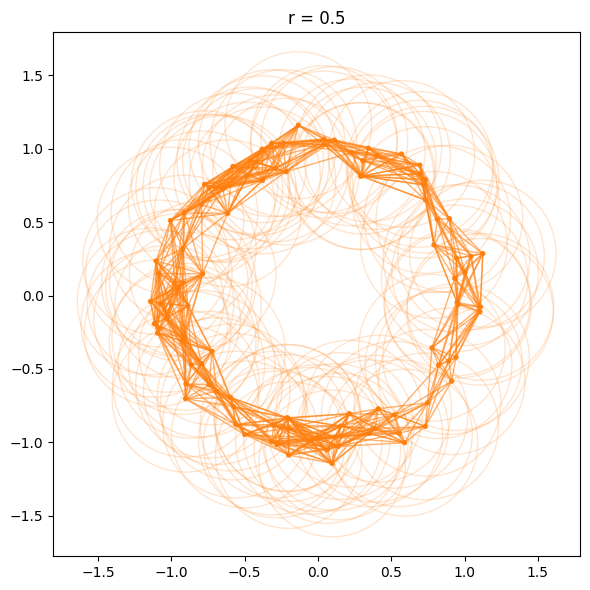

In [34]:
plot_rips_complex(ndatos1, R=0.5, label='r = 0.5', maxdim=1)

In [35]:
alpha1 = gudhi.AlphaComplex(points = ndatos1)

simplex_tree = alpha1.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 557 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00

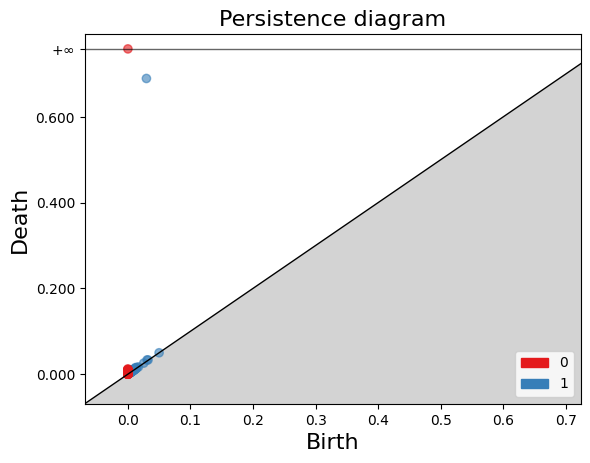

In [36]:
dgm = simplex_tree.persistence()
gudhi.plot_persistence_diagram(dgm, legend = True)
plt.show()

Base 2

Rips

In [37]:
distancias2 = pd.DataFrame(squareform(pdist(datos2[['0', '1']]), 'euclidean'), columns=datos2.index.values, index=datos2.index.values)
print('Diámetro de la base de datos 2: ', round(max(distancias2.max())))

Diámetro de la base de datos 2:  4


In [38]:
rips2 = gudhi.RipsComplex(points = ndatos2, max_edge_length = 4)
simplex_tree2 = rips2.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 2 is of dimension ' + repr(simplex_tree2.dimension()) + ' | ' + repr(simplex_tree2.num_simplices()) + ' simplices | ' + repr(simplex_tree2.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree2.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 2 is of dimension 2 | 166265 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 

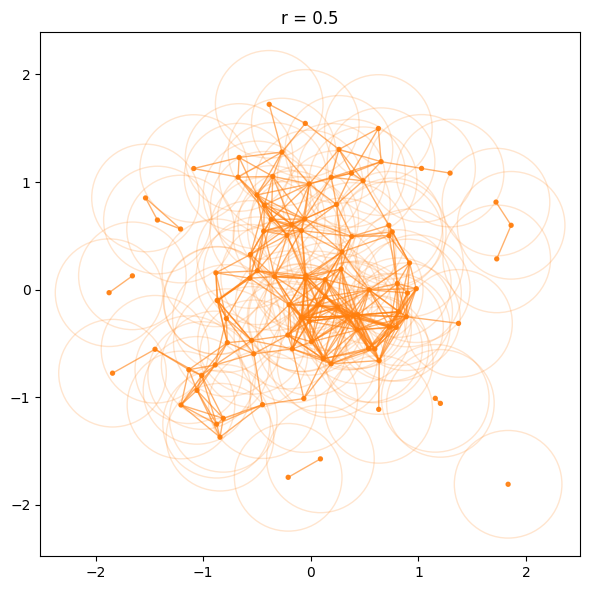

In [39]:
plot_rips_complex(ndatos2, R=0.5, label='r = 0.5', maxdim=1)

Complejo alpha

In [40]:
alpha2 = gudhi.AlphaComplex(points = ndatos2)

simplex_tree3 = alpha2.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree3.dimension()) + ' | ' + repr(simplex_tree3.num_simplices()) + ' simplices | ' + repr(simplex_tree3.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree3.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 573 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00

Base 3
Rips

In [41]:
distancias3 = pd.DataFrame(squareform(pdist(datos3[['0', '1']]), 'euclidean'), columns=datos3.index.values, index=datos3.index.values)
print('Diámetro de la base de datos 3: ', round(max(distancias3.max())))

Diámetro de la base de datos 3:  39


In [42]:
rips3 = gudhi.RipsComplex(points = ndatos3, max_edge_length=2)

simplex_tree3 = rips3.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 1 is of dimension ' + repr(simplex_tree3.dimension()) + ' | ' + repr(simplex_tree3.num_simplices()) + ' simplices | ' + repr(simplex_tree3.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree3.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 1 is of dimension 2 | 444 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.0

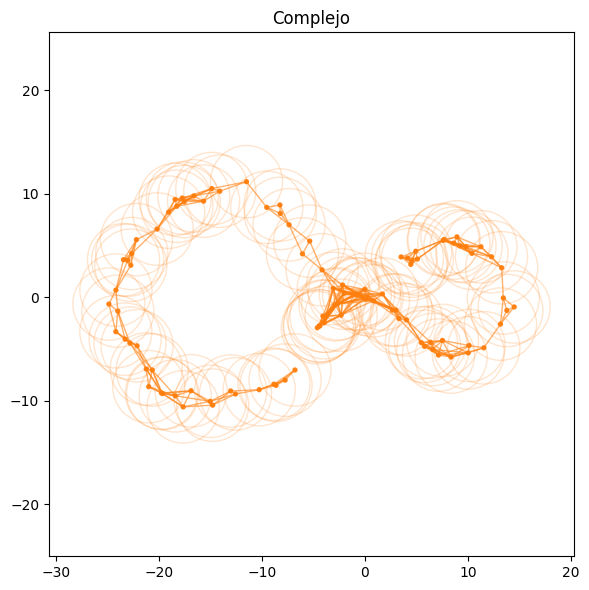

In [47]:
plot_rips_complex(ndatos3, R=3.5, label='Complejo', maxdim=1)

Complejo alpha

In [49]:
alpha3 = gudhi.AlphaComplex(points = ndatos3)

simplex_tree3 = alpha3.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree3.dimension()) + ' | ' + repr(simplex_tree3.num_simplices()) + ' simplices | ' + repr(simplex_tree3.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree3.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 559 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00